In [1]:
# !pip3 install osmnx
# !pip3 install networkx

import os, tqdm
import pandas as pd
import osmnx as ox
import networkx as nx
from shapely.geometry import Point, LineString
from shapely.ops import nearest_points, transform
import pyproj

In [2]:
%%capture
# Configure OSMnx
ox.config(use_cache=True, log_console=True)

In [3]:
os.makedirs('./data', exist_ok=True)

In [4]:
loc = 'Padua, Italy'

- Compare walk network vs all

In [5]:
# Download the street network

# what type of street network to get if custom_filter is None
# network_type = {"all", "all_public", "bike", "drive", "drive_service", "walk"}

network_type = 'walk'

city_graph = ox.graph_from_place(loc, network_type=network_type, simplify=True, retain_all=True, truncate_by_edge=True)

In [6]:
city_graph.nodes()

NodeView((141540485, 141541859, 141542464, 141542473, 141542517, 141542774, 141542775, 179003095, 179003107, 179003160, 179008739, 179008750, 179008757, 179008764, 179008769, 179008770, 179008777, 179008781, 179008789, 179008802, 179008806, 179008810, 179008814, 179008817, 180963842, 180963852, 180963858, 180963928, 180963954, 181623219, 181628635, 181628846, 181660440, 181660513, 181660898, 181661567, 181739253, 181739300, 181739322, 181739343, 181739355, 181739567, 181739786, 181739878, 181739956, 183886690, 183886769, 183886791, 183886827, 183886874, 185781297, 185781328, 185781347, 185781368, 185781396, 185781413, 185781432, 185781466, 185781508, 185781531, 185781576, 185781587, 185816471, 185838206, 185838216, 185838220, 185838231, 185838233, 185838236, 185838243, 185838277, 185838294, 185838435, 185838446, 185838479, 185844537, 185844558, 185844564, 185844587, 185852692, 185862044, 185862045, 185862051, 185862082, 185862086, 185862091, 185862098, 185862131, 185862155, 185862167, 

In [7]:
%%capture
# https://wiki.openstreetmap.org/wiki/Key:amenity?uselang=en-GB

# shops = ox.geometries_from_place(loc, tags={'shop': True})
supermarkets = ox.geometries_from_place(loc, tags={'shop': ['supermarket','convenience']})
# hospitals = ox.geometries_from_place(loc, tags={'amenity': 'hospital'})
pharmacies = ox.geometries_from_place(loc, tags={'amenity': 'pharmacy'})
kindergarten = ox.geometries_from_place(loc, tags={'amenity': 'kindergarten'})
post_office = ox.geometries_from_place(loc, tags={'amenity': 'post_office'})
doctors = ox.geometries_from_place(loc, tags={'amenity': 'doctors'})
cafe = ox.geometries_from_place(loc, tags={'amenity': ['cafe', 'bar']})

In [8]:
def line_string_distance(line_string): # LineString(Point(lon, lat), Point(lon, lat))
    # Define a projection transformer (WGS84 to a planar coordinate system)
    proj_wgs84 = pyproj.CRS('EPSG:4326')
    proj_utm = pyproj.CRS('EPSG:32610')  # UTM zone 10N, adjust as needed for your location
    project = pyproj.Transformer.from_crs(proj_wgs84, proj_utm, always_xy=True).transform

    # Transform the LineString to the planar coordinate system
    line_transformed = transform(project, line_string)

    # Calculate the distance
    return line_transformed.length

In [9]:
new_service_nodes = []
new_nodes = []

In [10]:
# Define a function to insert a service node into the graph
def insert_service_node(graph, service_type, service_lon, service_lat):

    global new_service_nodes, new_nodes
    
    # Find the nearest edge and get the geometry to the service location
    u, v, key = ox.nearest_edges(graph, X=service_lon, Y=service_lat) # (u, v have x, y coordinates)

    # Create a point for the service location
    point = Point(service_lon, service_lat) # (lon, lat)

    # If edge is not a straight line, i.e. contains a 'geometry'
    try:
        edge_geom = graph.edges[u, v, key]['geometry']
        edge_weight = edge_geom.length
        edge_weight_linear = (edge_geom.coords[0]).distance(edge_geom.coords[-1]) * 111320

    except:
        # Coordinates of the nearest_edges
        edge_geom = LineString([(graph.nodes[u]['x'], graph.nodes[u]['y']),(graph.nodes[v]['x'], graph.nodes[v]['y'])])
        edge_weight = edge_weight_linear = Point(graph.nodes[u]['x'], graph.nodes[u]['y']).distance(Point(graph.nodes[v]['x'], graph.nodes[v]['y'])) * 111320
        # edge_weight = line_string_distance(edge_geom)
        
    # Calculate the closest point on the edge to the service location
    closest_point_on_edge = nearest_points(edge_geom, point)[0] # (lon. lat)

    # Ratio of first segment to total length
    if closest_point_on_edge == Point(edge_geom.coords[0]):
        graph.nodes[u]['service_type'] = service_type
        new_service_nodes.append(u)
        return 0
    elif closest_point_on_edge == Point(edge_geom.coords[-1]):
        graph.nodes[v]['service_type'] = service_type
        new_service_nodes.append(v)
        return 0

    # Create new edges with the split geometries
    edge_geom_1 = LineString([edge_geom.coords[0], (closest_point_on_edge.x, closest_point_on_edge.y)])
    edge_geom_2 = LineString([(closest_point_on_edge.x, closest_point_on_edge.y), edge_geom.coords[-1]])

    # Insert the new node into the graph
    new_node_id = max(graph.nodes()) + 1  # or any unique ID
    graph.add_node(new_node_id, x=closest_point_on_edge.x, y=closest_point_on_edge.y, service_type=service_type)

    ratio_segment_1 = closest_point_on_edge.distance(Point(edge_geom.coords[0])) * 111320 / edge_weight_linear

    # Split weight based on ratio
    # weight_segment_1 = line_string_distance(edge_geom_1)
    # weight_segment_2 = line_string_distance(edge_geom_2)
    weight_segment_1 = edge_weight * ratio_segment_1
    weight_segment_2 = edge_weight * (1 - ratio_segment_1)

    # # Remove the old edge and add the new edges
    graph.remove_edge(u, v)
    graph.add_edge(u, new_node_id, key=key, geometry=edge_geom_1, length=weight_segment_1)
    graph.add_edge(new_node_id, v, key=key, geometry=edge_geom_2, length=weight_segment_2)

    new_nodes.append([(graph.nodes[u]['x'], graph.nodes[u]['y']),(graph.nodes[v]['x'], graph.nodes[v]['y']),closest_point_on_edge,edge_weight,weight_segment_1,weight_segment_2])

    return new_node_id

In [11]:
%%capture

# x = longitude, y = latitude

for s in tqdm.tqdm(['supermarkets', 'pharmacies', 'kindergarten', 'post_office', 'doctors', 'cafe']):
    if 'node' in list(eval(s).index.get_level_values(0)):
        for v in eval(s)['geometry']['node'].get_coordinates().iterrows():
            insert_service_node(city_graph, s, v[1]['x'], v[1]['y'])
    if 'way' in list(eval(s).index.get_level_values(0)):
        for v in eval(s)['geometry']['way'].get_coordinates().groupby('osmid').agg('mean').iterrows():
            insert_service_node(city_graph, s, v[1]['x'], v[1]['y'])

In [12]:
pd.DataFrame(new_nodes, columns=['u', 'v', 'new_node', 'edge_weight', 'weight_segment_1', 'weight_segment_2']).to_csv('./data/modified_nodes.csv', index=False)

In [26]:
# Convert nodes and edges to Pandas DataFrames
nodes_df = pd.DataFrame.from_dict(dict(city_graph.nodes(data=True)), orient='index')
edges_df = nx.to_pandas_edgelist(city_graph)

In [27]:
nodes_df['id'] = nodes_df.index
nodes_df['label'] = nodes_df['service_type']
edges_df['weight'] = edges_df['length'] / 85.2

# Walking speed 1.42 m/s so it is 85.2 metres per minute

In [33]:
nodes_df[['id', 'label']].to_csv(os.path.join('./data', 'nodes.csv'), index=False)
edges_df[['source', 'target', 'weight']].to_csv(os.path.join('./data', 'edges.csv'), index=False)

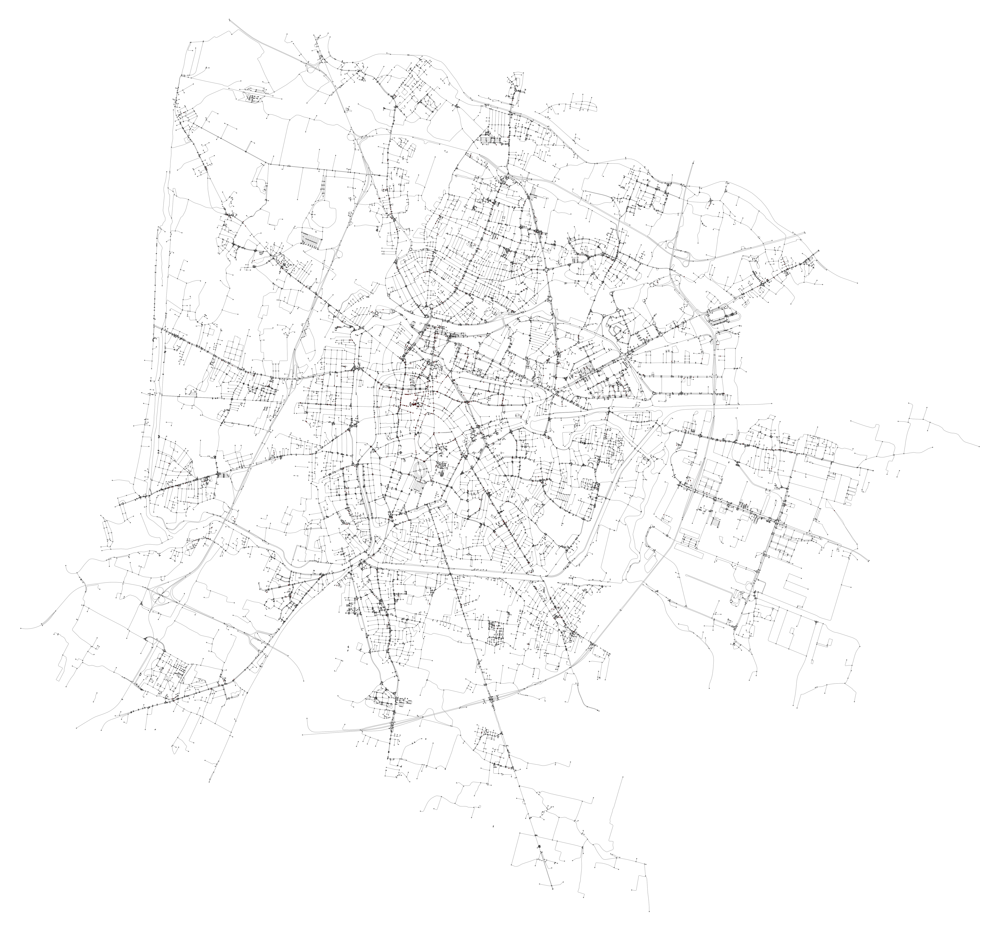

(<Figure size 8000x8000 with 1 Axes>, <Axes: >)

In [16]:
node_c = ['r' if 'service_type' in data else 'w' for _, data in city_graph.nodes(data=True)]
ox.plot_graph(city_graph, node_color=node_c, bgcolor='w', node_edgecolor='k', node_size=8, edge_linewidth=1, edge_alpha=1, figsize=(80,80), dpi=500, save=True, filepath=os.path.join('./data', loc.split(', ')[0] + '_city_graph.png'))